In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore

In [2]:
pd.set_option('display.max.rows', 1001)

df = pd.read_csv(r"C:\Users\Public\Documents\Datasets\Data Cleaning\imdb_movie_dataset.csv")
df

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced ...,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe S...",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a te...",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fa...",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diag...,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richar...",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling thea...",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth Ma...",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of th...,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola D...",2016,123,6.2,393727,325.02,40.0
5,6,The Great Wall,"Action,Adventure,Fantasy",European mercenaries searching for black powde...,Yimou Zhang,"Matt Damon, Tian Jing, Willem Dafoe, Andy Lau",2016,103,6.1,56036,45.13,42.0
6,7,La La Land,"Comedy,Drama,Music",A jazz pianist falls for an aspiring actress i...,Damien Chazelle,"Ryan Gosling, Emma Stone, Rosemarie DeWitt, J....",2016,128,8.3,258682,151.06,93.0
7,8,Mindhorn,Comedy,A has-been actor best known for playing the ti...,Sean Foley,"Essie Davis, Andrea Riseborough, Julian Barrat...",2016,89,6.4,2490,NaN,71.0
8,9,The Lost City of Z,"Action,Adventure,Biography","A true-life drama, centering on British explor...",James Gray,"Charlie Hunnam, Robert Pattinson, Sienna Mille...",2016,141,7.1,7188,8.01,78.0
9,10,Passengers,"Adventure,Drama,Romance",A spacecraft traveling to a distant colony pla...,Morten Tyldum,"Jennifer Lawrence, Chris Pratt, Michael Sheen,...",2016,116,7.0,192177,100.01,41.0


# Data Exploration

In [3]:
df.describe()

,Rank,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,872.000000,936.000000
mean,500.500000,2012.783000,113.172000,6.723200,1.698083e+05,82.956376,58.985043
std,288.819436,3.205962,18.810908,0.945429,1.887626e+05,103.253540,17.194757
min,1.000000,2006.000000,66.000000,1.900000,6.100000e+01,0.000000,11.000000
25%,250.750000,2010.000000,100.000000,6.200000,3.630900e+04,13.270000,47.000000
50%,500.500000,2014.000000,111.000000,6.800000,1.107990e+05,47.985000,59.500000
75%,750.250000,2016.000000,123.000000,7.400000,2.399098e+05,113.715000,72.000000
max,1000.000000,2016.000000,191.000000,9.000000,1.791916e+06,936.630000,100.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Rank                1000 non-null   int64  
 1   Title               1000 non-null   object 
 2   Genre               1000 non-null   object 
 3   Description         1000 non-null   object 
 4   Director            1000 non-null   object 
 5   Actors              1000 non-null   object 
 6   Year                1000 non-null   int64  
 7   Runtime (Minutes)   1000 non-null   int64  
 8   Rating              1000 non-null   float64
 9   Votes               1000 non-null   int64  
 10  Revenue (Millions)  872 non-null    float64
 11  Metascore           936 non-null    float64
dtypes: float64(3), int64(4), object(5)
memory usage: 93.9+ KB


In [5]:
df.isnull().sum()

Rank                    0
Title                   0
Genre                   0
Description             0
Director                0
Actors                  0
Year                    0
Runtime (Minutes)       0
Rating                  0
Votes                   0
Revenue (Millions)    128
Metascore              64
dtype: int64

In [6]:
duplicates = df[df.duplicated()]
print(df.duplicated().sum())  

0


# Data Cleaning

* Handle Null Values

In [9]:
df['Rating'] = df['Rating'].fillna(df['Rating'].median())
df

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced ...,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe S...",2014,121,8.1,757074,333.13,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a te...",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fa...",2012,124,7.0,485820,126.46,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diag...,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richar...",2016,117,7.3,157606,138.12,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling thea...",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth Ma...",2016,108,7.2,60545,270.32,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of th...,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola D...",2016,123,6.2,393727,325.02,40.0
5,6,The Great Wall,"Action,Adventure,Fantasy",European mercenaries searching for black powde...,Yimou Zhang,"Matt Damon, Tian Jing, Willem Dafoe, Andy Lau",2016,103,6.1,56036,45.13,42.0
6,7,La La Land,"Comedy,Drama,Music",A jazz pianist falls for an aspiring actress i...,Damien Chazelle,"Ryan Gosling, Emma Stone, Rosemarie DeWitt, J....",2016,128,8.3,258682,151.06,93.0
7,8,Mindhorn,Comedy,A has-been actor best known for playing the ti...,Sean Foley,"Essie Davis, Andrea Riseborough, Julian Barrat...",2016,89,6.4,2490,NaN,71.0
8,9,The Lost City of Z,"Action,Adventure,Biography","A true-life drama, centering on British explor...",James Gray,"Charlie Hunnam, Robert Pattinson, Sienna Mille...",2016,141,7.1,7188,8.01,78.0
9,10,Passengers,"Adventure,Drama,Romance",A spacecraft traveling to a distant colony pla...,Morten Tyldum,"Jennifer Lawrence, Chris Pratt, Michael Sheen,...",2016,116,7.0,192177,100.01,41.0


In [4]:
df['Revenue (Millions)'] = df['Revenue (Millions)'].fillna(df['Revenue (Millions)'].median())
df

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced ...,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe S...",2014,121,8.1,757074,333.130,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a te...",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fa...",2012,124,7.0,485820,126.460,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diag...,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richar...",2016,117,7.3,157606,138.120,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling thea...",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth Ma...",2016,108,7.2,60545,270.320,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of th...,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola D...",2016,123,6.2,393727,325.020,40.0
5,6,The Great Wall,"Action,Adventure,Fantasy",European mercenaries searching for black powde...,Yimou Zhang,"Matt Damon, Tian Jing, Willem Dafoe, Andy Lau",2016,103,6.1,56036,45.130,42.0
6,7,La La Land,"Comedy,Drama,Music",A jazz pianist falls for an aspiring actress i...,Damien Chazelle,"Ryan Gosling, Emma Stone, Rosemarie DeWitt, J....",2016,128,8.3,258682,151.060,93.0
7,8,Mindhorn,Comedy,A has-been actor best known for playing the ti...,Sean Foley,"Essie Davis, Andrea Riseborough, Julian Barrat...",2016,89,6.4,2490,47.985,71.0
8,9,The Lost City of Z,"Action,Adventure,Biography","A true-life drama, centering on British explor...",James Gray,"Charlie Hunnam, Robert Pattinson, Sienna Mille...",2016,141,7.1,7188,8.010,78.0
9,10,Passengers,"Adventure,Drama,Romance",A spacecraft traveling to a distant colony pla...,Morten Tyldum,"Jennifer Lawrence, Chris Pratt, Michael Sheen,...",2016,116,7.0,192177,100.010,41.0


In [5]:
df['Metascore'] = df['Metascore'].fillna(df['Metascore'].median())
df

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,1,Guardians of the Galaxy,"Action,Adventure,Sci-Fi",A group of intergalactic criminals are forced ...,James Gunn,"Chris Pratt, Vin Diesel, Bradley Cooper, Zoe S...",2014,121,8.1,757074,333.130,76.0
1,2,Prometheus,"Adventure,Mystery,Sci-Fi","Following clues to the origin of mankind, a te...",Ridley Scott,"Noomi Rapace, Logan Marshall-Green, Michael Fa...",2012,124,7.0,485820,126.460,65.0
2,3,Split,"Horror,Thriller",Three girls are kidnapped by a man with a diag...,M. Night Shyamalan,"James McAvoy, Anya Taylor-Joy, Haley Lu Richar...",2016,117,7.3,157606,138.120,62.0
3,4,Sing,"Animation,Comedy,Family","In a city of humanoid animals, a hustling thea...",Christophe Lourdelet,"Matthew McConaughey,Reese Witherspoon, Seth Ma...",2016,108,7.2,60545,270.320,59.0
4,5,Suicide Squad,"Action,Adventure,Fantasy",A secret government agency recruits some of th...,David Ayer,"Will Smith, Jared Leto, Margot Robbie, Viola D...",2016,123,6.2,393727,325.020,40.0
5,6,The Great Wall,"Action,Adventure,Fantasy",European mercenaries searching for black powde...,Yimou Zhang,"Matt Damon, Tian Jing, Willem Dafoe, Andy Lau",2016,103,6.1,56036,45.130,42.0
6,7,La La Land,"Comedy,Drama,Music",A jazz pianist falls for an aspiring actress i...,Damien Chazelle,"Ryan Gosling, Emma Stone, Rosemarie DeWitt, J....",2016,128,8.3,258682,151.060,93.0
7,8,Mindhorn,Comedy,A has-been actor best known for playing the ti...,Sean Foley,"Essie Davis, Andrea Riseborough, Julian Barrat...",2016,89,6.4,2490,47.985,71.0
8,9,The Lost City of Z,"Action,Adventure,Biography","A true-life drama, centering on British explor...",James Gray,"Charlie Hunnam, Robert Pattinson, Sienna Mille...",2016,141,7.1,7188,8.010,78.0
9,10,Passengers,"Adventure,Drama,Romance",A spacecraft traveling to a distant colony pla...,Morten Tyldum,"Jennifer Lawrence, Chris Pratt, Michael Sheen,...",2016,116,7.0,192177,100.010,41.0


* Handle the Outliers

<Axes: ylabel='Runtime (Minutes)'>

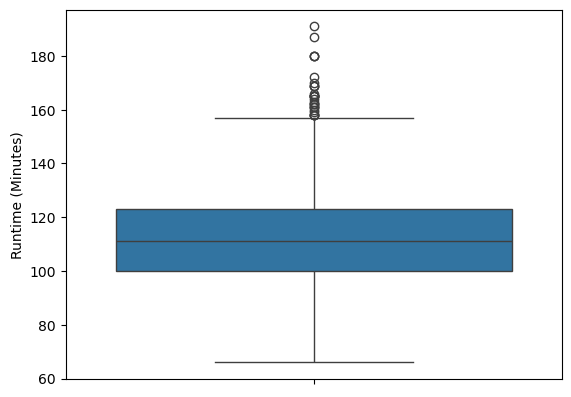

In [10]:
outlier_duration = sns.boxplot(df['Runtime (Minutes)'])
outlier_duration

<Axes: ylabel='Votes'>

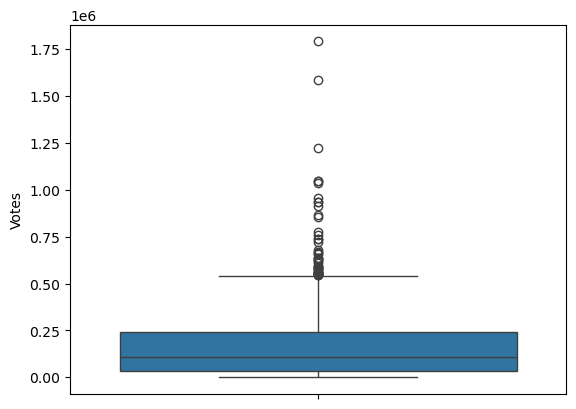

In [12]:
outlier_votes = sns.boxplot(df['Votes'])
outlier_votes

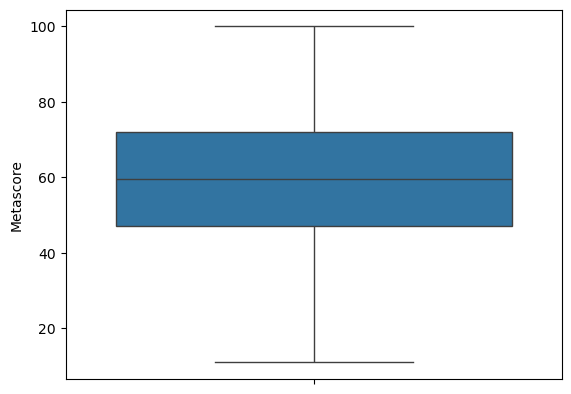

In [7]:
sns.boxplot(df['Metascore'])
plt.show()

<Axes: ylabel='Revenue (Millions)'>

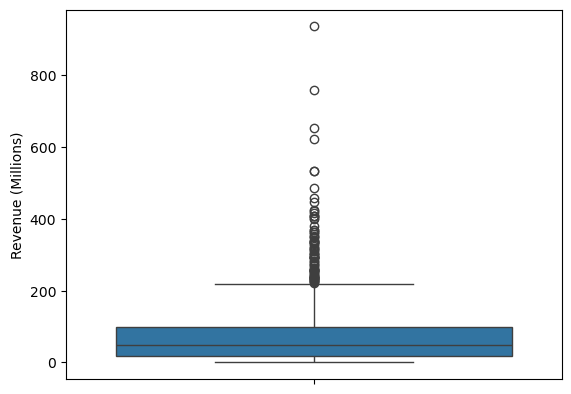

In [6]:
outlier_revenue = sns.boxplot(df['Revenue (Millions)'])
outlier_revenue

* Film Analysis by Genre (Separate Genres)

In [20]:
# Split the Genre into a list

df['Genre'] = df['Genre'].str.split(',')

In [21]:
# Break down the rows for each genre

df_exploded = df.explode('Genre')

In [22]:
# Sort by genre first, then by title

df_sorted = df_exploded.sort_values(by=['Genre', 'Title']).reset_index(drop=True)

df_sorted

,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,508,(500) Days of Summer,NaN,An offbeat romantic comedy about a woman who d...,Marc Webb,"Zooey Deschanel, Joseph Gordon-Levitt, Geoffre...",2009,95,7.7,398972,32.39,76.0
1,119,10 Cloverfield Lane,NaN,"After getting in a car accident, a woman is he...",Dan Trachtenberg,"John Goodman, Mary Elizabeth Winstead, John Ga...",2016,104,7.2,192968,71.90,76.0
2,697,10 Years,NaN,"The night before their high school reunion, a ...",Jamie Linden,"Channing Tatum, Rosario Dawson, Chris Pratt, J...",2011,100,6.1,19636,0.20,NaN
3,112,12 Years a Slave,NaN,"In the antebellum United States, Solomon North...",Steve McQueen,"Chiwetel Ejiofor, Michael Kenneth Williams, Mi...",2013,134,8.1,486338,56.67,96.0
4,818,127 Hours,NaN,An adventurous mountain climber becomes trappe...,Danny Boyle,"James Franco, Amber Tamblyn, Kate Mara, Sean Bott",2010,94,7.6,294010,18.33,82.0
5,169,13 Hours,NaN,"During an attack on a U.S. compound in Libya, ...",Michael Bay,"John Krasinski, Pablo Schreiber, James Badge D...",2016,144,7.3,76935,52.82,48.0
6,805,1408,NaN,A man who specializes in debunking paranormal ...,Mikael Håfström,"John Cusack, Samuel L. Jackson, Mary McCormack...",2007,104,6.8,221073,71.98,64.0
7,923,17 Again,NaN,Mike O'Donnell is ungrateful for how his life ...,Burr Steers,"Zac Efron, Matthew Perry, Leslie Mann, Thomas ...",2009,102,6.4,152808,64.15,48.0
8,473,2012,NaN,A frustrated writer struggles to keep his fami...,Roland Emmerich,"John Cusack, Thandie Newton, Chiwetel Ejiofor,...",2009,158,5.8,297984,166.11,49.0
9,248,20th Century Women,NaN,"The story of a teenage boy, his mother, and tw...",Mike Mills,"Annette Bening, Elle Fanning, Greta Gerwig, Bi...",2016,119,7.4,14708,5.66,83.0


In [7]:
genre_counts = df_sorted['Genre'].value_counts()
print(genre_counts)

Genre
Drama        513
Action       303
Comedy       279
Adventure    259
Thriller     195
Crime        150
Romance      141
Sci-Fi       120
Horror       119
Mystery      106
Fantasy      101
Biography     81
Family        51
Animation     49
History       29
Sport         18
Music         16
War           13
Western        7
Musical        5
Name: count, dtype: int64


In [83]:
df_sorted.set_index(['Genre','Title'], inplace = True)

df_sorted

index  Rank  \
Genre     Title                                                             
Action    13 Hours                                                0   169   
          2012                                                    1   473   
          21 Jump Street                                          2   273   
          22 Jump Street                                          3   277   
          3 Days to Kill                                          4   959   
          300                                                     5   114   
          300: Rise of an Empire                                  6   424   
          After Earth                                             7   949   
          Aliens vs Predator - Requiem                            8   156   
          Allegiant                                               9   205   
          Allied                                                 10    72   
          American Sniper                                        11   332   
          Angry Birds                                            12   485   
          Ant-Man                                                13   180   
          Apocalypto                                             14   233   
          Assassin's Creed                                       15    30   
          Avatar                                                 16    88   
          Avengers: Age of Ultron                                17    95   
          Bahubali: The Beginning                                18    27   
          Bastille Day                                           19   616   
          Batman v Superman: Dawn of Justice                     20    61   
          Battleship                                             21   257   
          Ben-Hur                                                22   370   
          Beowulf                                                23   803   
          Big Hero 6                                             24   449   
          Birth of the Dragon                                    25   526   
          Blood Father                                           26   602   
          Body of Lies                                           27   738   
          Boyka: Undisputed IV                                   28   124   
          Bronson                                                29   403   
          Busanhaeng                                             30   291   
          Captain America: Civil War                             31    36   
          Captain America: The First Avenger                     32   196   
          Captain America: The Winter Soldier                    33   217   
          Casino Royale                                          34   165   
          Central Intelligence                                   35   200   
          Centurion                                              36   921   
          Chappie                                                37   518   
          Clash of the Titans                                    38   576   
          Cloverfield                                            39   493   
          Collide                                                40   376   
          Colossal                                               41    15   
          Conan the Barbarian                                    42   759   
          Criminal                                               43   373   
          Dangal                                                 44   118   
          Dawn of the Planet of the Apes                         45   177   
          Deadpool                                               46    34   
          Death Race                                             47   955   
          Deepwater Horizon                                      48    70   
          Deja Vu                                                49   533   
          District 9                                      

# Statistical Analysis

* Mean, median, and standard deviation of movie ratings

In [14]:
print("Mean rating:", df['Rating'].mean())
print("Median rating:", df['Rating'].median())
print("Standar deviasi of rating:", df['Rating'].std())


Mean rating: 6.723199999999999
Median rating: 6.8
Standar deviasi of rating: 0.9454287892779637


* Distribution Rating

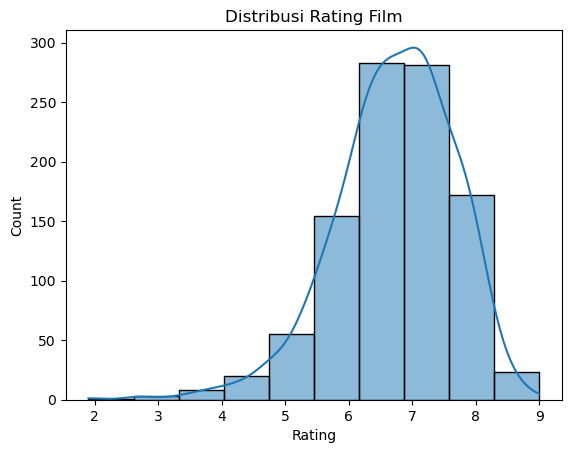

In [15]:
import matplotlib.pyplot as plt
sns.histplot(df['Rating'], bins=10, kde=True)
plt.title("Distribusi Rating Film")
plt.show()

In [20]:
genre_rating = df_sorted.groupby('Genre')['Rating'].mean().sort_values(ascending=False)
print(genre_rating)


Genre
War          7.353846
Animation    7.324490
Biography    7.290123
History      7.127586
Music        7.075000
Sport        7.011111
Drama        6.953801
Musical      6.940000
Mystery      6.886792
Crime        6.786667
Adventure    6.772201
Western      6.771429
Sci-Fi       6.716667
Romance      6.685816
Family       6.684314
Comedy       6.647670
Action       6.614521
Thriller     6.593333
Fantasy      6.548515
Horror       6.089916
Name: Rating, dtype: float64


In [82]:
df_sorted.reset_index(inplace = True)

df_sorted

,index,Rank,Title,Genre,Description,Director,Actors,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
0,0,169,13 Hours,Action,"During an attack on a U.S. compound in Libya, ...",Michael Bay,"John Krasinski, Pablo Schreiber, James Badge D...",2016,144,7.3,76935,52.82,48.0
1,1,473,2012,Action,A frustrated writer struggles to keep his fami...,Roland Emmerich,"John Cusack, Thandie Newton, Chiwetel Ejiofor,...",2009,158,5.8,297984,166.11,49.0
2,2,273,21 Jump Street,Action,A pair of underachieving cops are sent back to...,Phil Lord,"Jonah Hill, Channing Tatum, Ice Cube,Brie Larson",2012,110,7.2,432046,138.45,69.0
3,3,277,22 Jump Street,Action,After making their way through high school (tw...,Phil Lord,"Channing Tatum, Jonah Hill, Ice Cube,Nick Offe...",2014,112,7.1,280110,191.62,71.0
4,4,959,3 Days to Kill,Action,A dying CIA agent trying to reconnect with his...,McG,"Kevin Costner, Hailee Steinfeld, Connie Nielse...",2014,117,6.2,73567,30.69,40.0
5,5,114,300,Action,King Leonidas of Sparta and a force of 300 men...,Zack Snyder,"Gerard Butler, Lena Headey, David Wenham, Domi...",2006,117,7.7,637104,210.59,52.0
6,6,424,300: Rise of an Empire,Action,Greek general Themistokles leads the charge ag...,Noam Murro,"Sullivan Stapleton, Eva Green, Lena Headey, Ha...",2014,102,6.2,237887,106.37,48.0
7,7,949,After Earth,Action,A crash landing leaves Kitai Raige and his fat...,M. Night Shyamalan,"Jaden Smith, David Denman, Will Smith,Sophie O...",2013,100,4.9,166512,60.52,33.0
8,8,156,Aliens vs Predator - Requiem,Action,Warring alien and predator races descend on a ...,Colin Strause,"Reiko Aylesworth, Steven Pasquale,Shareeka Epp...",2007,94,4.7,97618,41.80,29.0
9,9,205,Allegiant,Action,After the earth-shattering revelations of Insu...,Robert Schwentke,"Shailene Woodley, Theo James, Jeff Daniels,Nao...",2016,120,5.7,70504,66.00,33.0


# Film Analysis by Year

* Number of Films per Year

<Axes: title={'center': 'Number of Films per Year'}, xlabel='Year'>

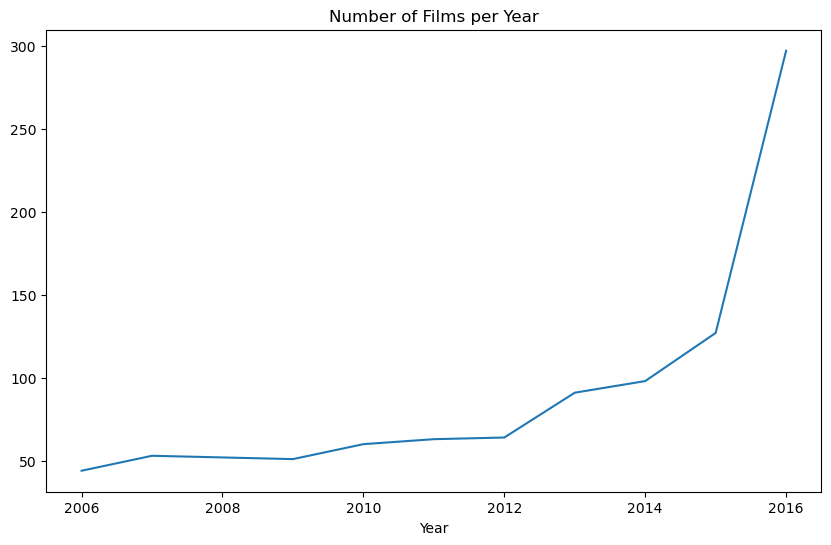

In [13]:
movies_per_year = df['Year'].value_counts().sort_index()
movies_per_year.plot(kind='line', title='Number of Films per Year', figsize=(10, 6))

* Average Rating per Year

<Axes: title={'center': 'Average Rating per Year'}, xlabel='Year'>

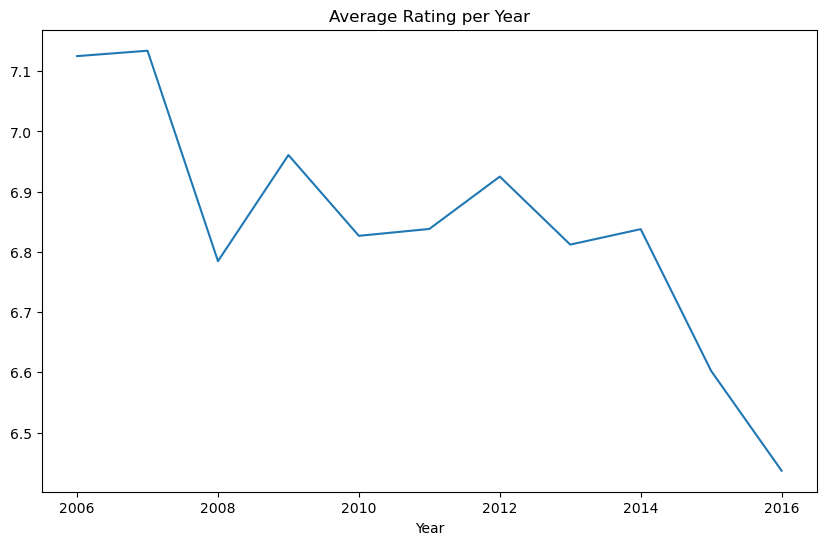

In [14]:
rating_per_year = df.groupby('Year')['Rating'].mean()
rating_per_year.plot(kind='line', title='Average Rating per Year', figsize=(10, 6))

# Film Analysis by Genre

<Axes: title={'center': 'Number of Films per Genre'}, xlabel='Genre'>

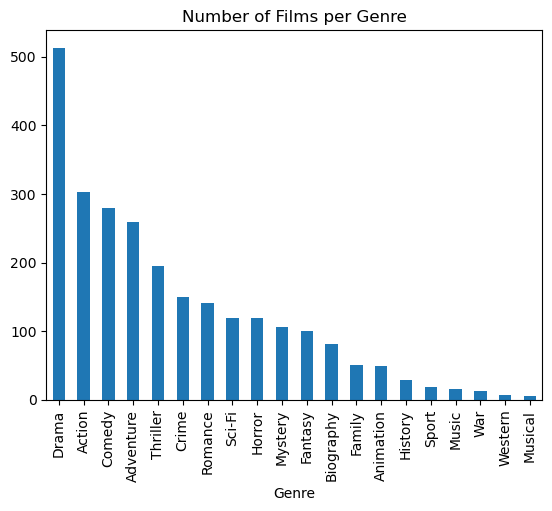

In [20]:
genre_counts = df_sorted['Genre'].value_counts()
genre_counts.plot(kind='bar', title='Number of Films per Genre')

<Axes: title={'center': 'Average Rating per Genre'}, xlabel='Genre'>

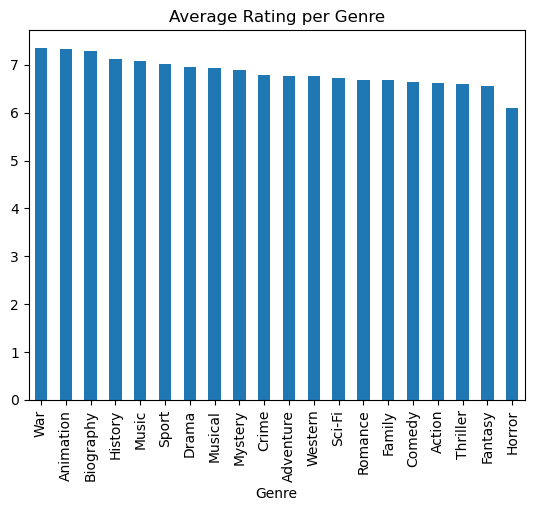

In [22]:
avg_rating_per_genre = df_sorted.groupby('Genre')['Rating'].mean()
avg_rating_per_genre.sort_values(ascending=False).plot(kind='bar', title='Average Rating per Genre')

# Film Analysis by Duration

* Distribution Film Duration

Text(0.5, 1.0, 'Distribution Film Duration')

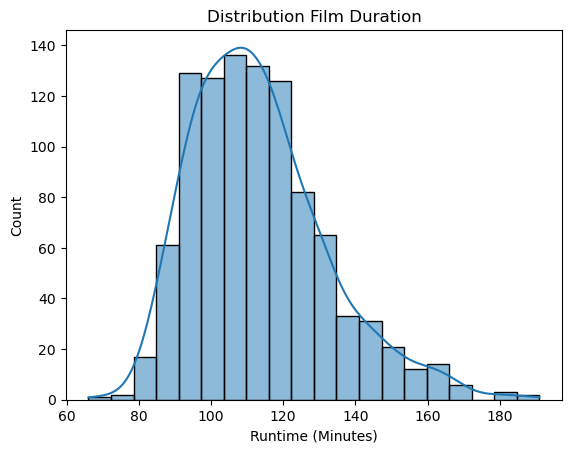

In [24]:
sns.histplot(df['Runtime (Minutes)'], bins=20, kde=True)
plt.title("Distribution Film Duration")

# Film Analysis by Director

* Director with the most number of films

<Axes: title={'center': 'Top 10 Director with the most number of movies'}, xlabel='Director'>

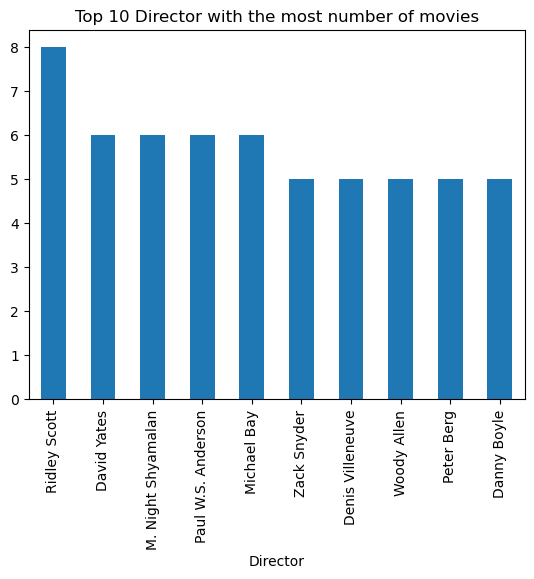

In [26]:
top_directors = df['Director'].value_counts().head(10)
top_directors.plot(kind='bar', title='Top 10 Director with the most number of movies')

* Director with the highest average rating (minimum 5 movies)

In [27]:
directors_avg_rating = df.groupby('Director')['Rating'].agg(['mean', 'count'])
directors_avg_rating = directors_avg_rating[directors_avg_rating['count'] >= 5]
top_directors_rating = directors_avg_rating.sort_values(by='mean', ascending=False).head(10)
print(top_directors_rating)


                       mean  count
Director                          
Christopher Nolan  8.680000      5
Martin Scorsese    7.920000      5
David Fincher      7.820000      5
Denis Villeneuve   7.760000      5
J.J. Abrams        7.580000      5
David Yates        7.433333      6
Danny Boyle        7.420000      5
Antoine Fuqua      7.040000      5
Zack Snyder        7.040000      5
Woody Allen        7.020000      5


#  Film Analysis by Metascore

* Distribution Metascore

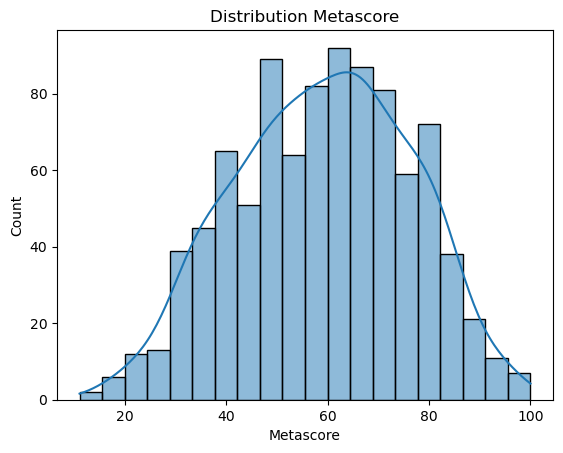

In [6]:
sns.histplot(df['Metascore'], bins=20, kde=True)
plt.title("Distribution Metascore")
plt.show()

* Avarage Metascore by Genre

In [8]:
average_genre = df_sorted.explode('Genre').groupby('Genre')['Metascore'].mean()
print(average_genre)

Genre
Action       53.830450
Adventure    57.670683
Animation    70.782609
Biography    68.943662
Comedy       57.604478
Crime        57.787234
Drama        63.497890
Family       55.620000
Fantasy      55.142857
History      70.857143
Horror       56.685185
Music        60.687500
Musical      60.000000
Mystery      59.272727
Romance      55.458015
Sci-Fi       58.228070
Sport        61.562500
Thriller     58.677596
War          64.500000
Western      53.500000
Name: Metascore, dtype: float64


# Film Analysis by Votes

* Distribution Votes

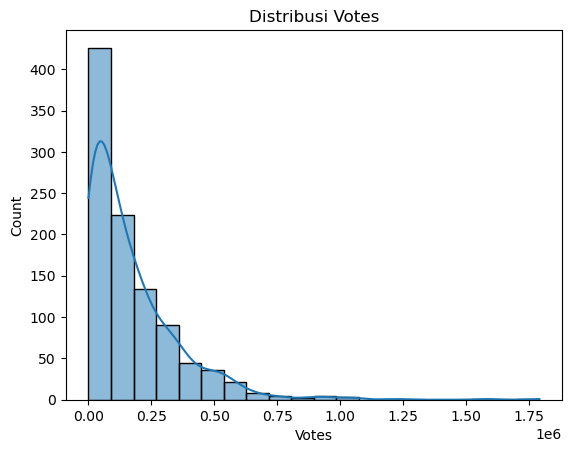

In [10]:
sns.histplot(df['Votes'], bins=20, kde=True)
plt.title("Distribusi Votes")
plt.show()

* Average Votes per Genre

In [13]:
average_votes_genre = df_sorted.explode('Genre').groupby('Genre')['Votes'].mean()
print(average_votes_genre)

Genre
Action       235761.610561
Adventure    257988.818533
Animation    208159.428571
Biography    151961.148148
Comedy       141663.172043
Crime        175600.713333
Drama        145777.968811
Family       146966.058824
Fantasy      214818.841584
History      144472.241379
Horror        87956.336134
Music        117435.562500
Musical      173376.200000
Mystery      180634.952830
Romance      124617.503546
Sci-Fi       294538.316667
Sport        114435.333333
Thriller     159702.764103
War          229783.769231
Western      256665.571429
Name: Votes, dtype: float64


# Tren and Insight

* Rating distribution by genre

Text(0.5, 1.0, 'Rating distribution by genre')

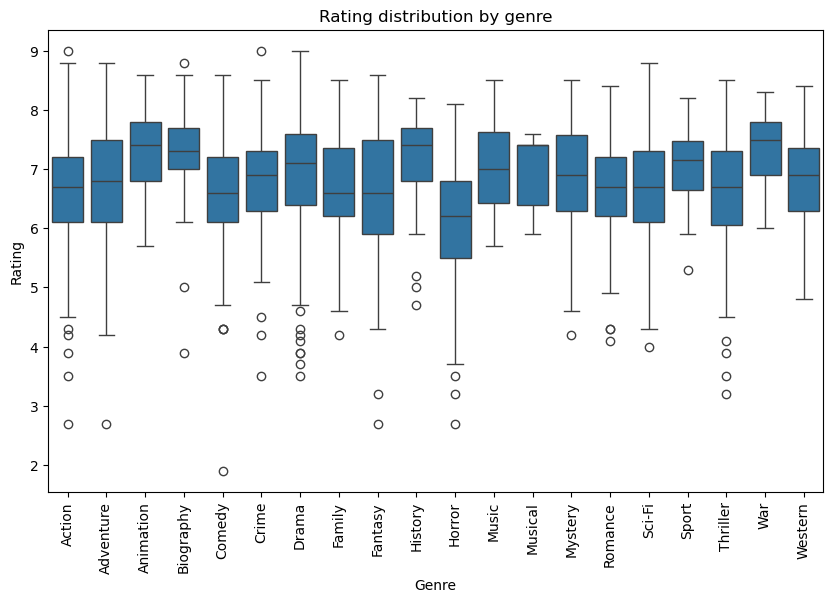

In [29]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Genre', y='Rating', data=df_sorted)
plt.xticks(rotation=90)
plt.title("Rating distribution by genre")


* Trend in number of popular films per year

<Axes: title={'center': 'Number of Popular Films per Year'}, xlabel='Year'>

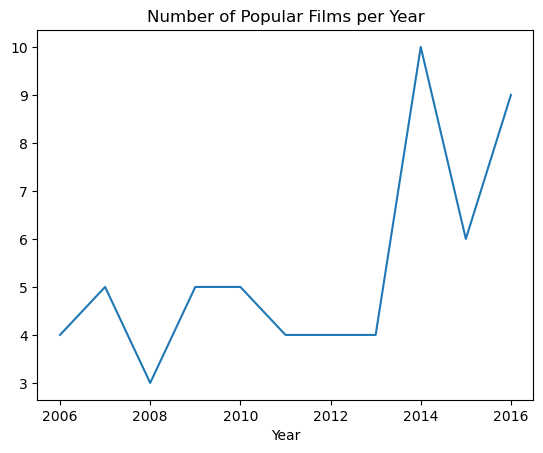

In [30]:
popular_movies = df[df['Rating'] > 8]
popular_movies_per_year = popular_movies['Year'].value_counts().sort_index()
popular_movies_per_year.plot(kind='line', title='Number of Popular Films per Year')

* Metascore Tren by Year

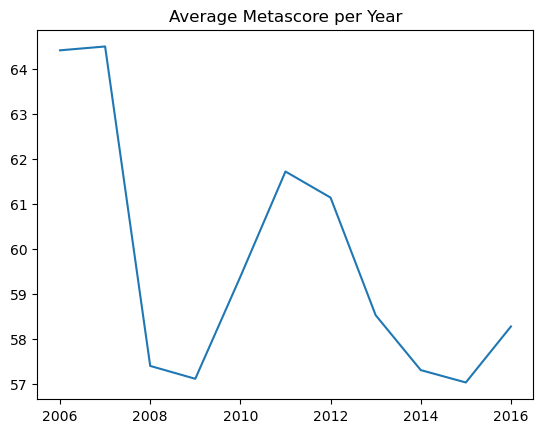

In [9]:
average_year = df.groupby('Year')['Metascore'].mean()
plt.plot(average_year)
plt.title("Average Metascore per Year")
plt.show()

* Votes Tren by Year

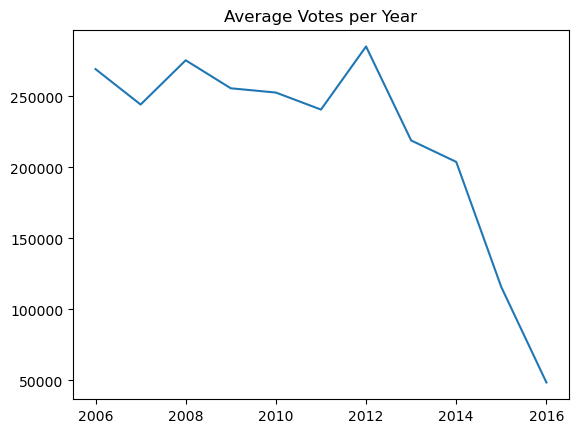

In [14]:
average_votes_year = df.groupby('Year')['Votes'].mean()
plt.plot(average_votes_year)
plt.title("Average Votes per Year")
plt.show()

* Revenue Tren by Year

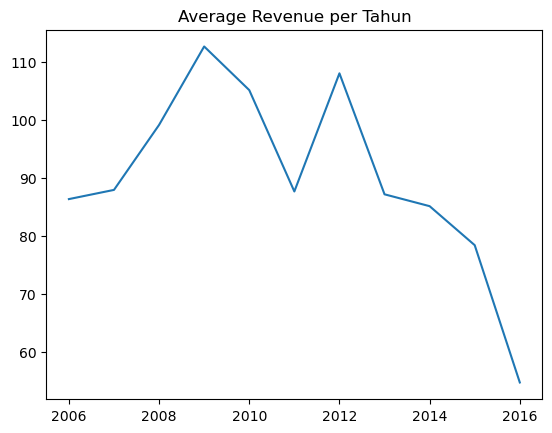

In [18]:
average_revenue_year = df.groupby('Year')['Revenue (Millions)'].mean()
plt.plot(average_revenue_year)
plt.title("Average Revenue per Tahun")
plt.show()

# Film Analysis by Revenue

* Disrtibution Revenue

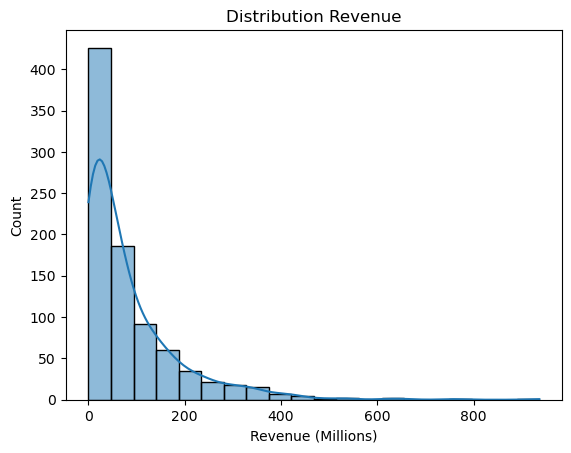

In [15]:
sns.histplot(df['Revenue (Millions)'], bins=20, kde=True)
plt.title("Distribution Revenue")
plt.show()

* Average Revenue per Genre

In [16]:
average_revenue_genre = df_sorted.explode('Genre').groupby('Genre')['Revenue (Millions)'].mean()
print(average_revenue_genre)

Genre
Action       124.494476
Adventure    154.177024
Animation    191.223404
Biography     55.801600
Comedy        75.750784
Crime         61.804769
Drama         49.844205
Family       126.175714
Fantasy      131.850108
History       52.923846
Horror        36.705269
Music         47.070000
Musical       81.642000
Mystery       54.627640
Romance       42.503023
Sci-Fi       135.552545
Sport         65.042500
Thriller      69.577255
War           53.433000
Western      111.824000
Name: Revenue (Millions), dtype: float64


# Correlation Analysis Between Columns

In [6]:
df.corr(numeric_only=True)

,Rank,Year,Runtime (Minutes),Rating,Votes,Revenue (Millions),Metascore
Rank,1.000000,-0.261605,-0.221739,-0.219555,-0.283876,-0.271592,-0.191869
Year,-0.261605,1.000000,-0.164900,-0.211219,-0.411904,-0.126790,-0.079305
Runtime (Minutes),-0.221739,-0.164900,1.000000,0.392214,0.407062,0.267953,0.211978
Rating,-0.219555,-0.211219,0.392214,1.000000,0.511537,0.217654,0.631897
Votes,-0.283876,-0.411904,0.407062,0.511537,1.000000,0.639661,0.325684
Revenue (Millions),-0.271592,-0.126790,0.267953,0.217654,0.639661,1.000000,0.142397
Metascore,-0.191869,-0.079305,0.211978,0.631897,0.325684,0.142397,1.000000


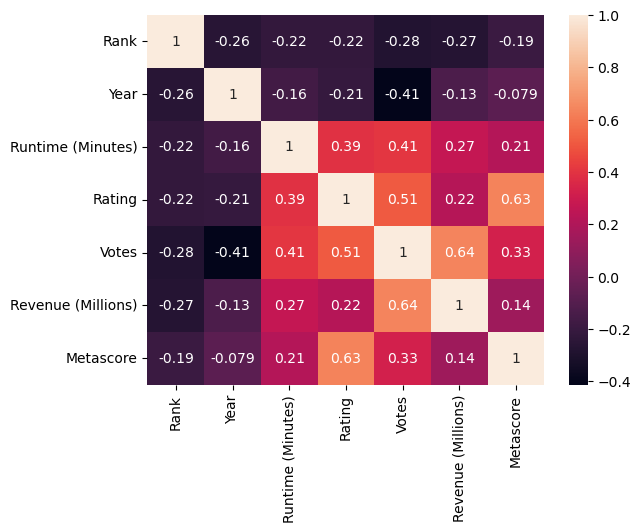

In [9]:
sns.heatmap(df.corr(numeric_only=True), annot = True)
plt.show()

Text(0.5, 1.0, 'Heatmap Korelasi Antar Kolom')

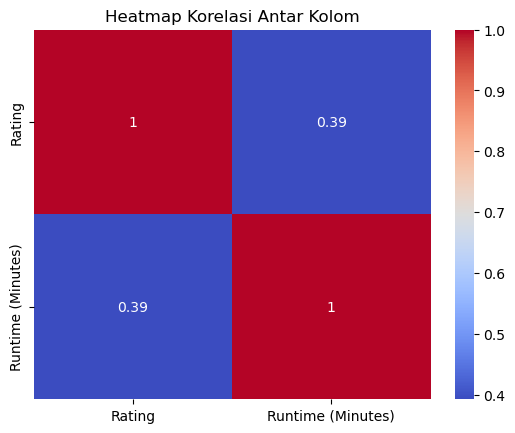

In [31]:
correlation_matrix = df[['Rating', 'Runtime (Minutes)']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Heatmap Korelasi Antar Kolom")


* Correlation between Duration and Film Rating

Text(0.5, 1.0, 'Correlation between Duration and Film Rating')

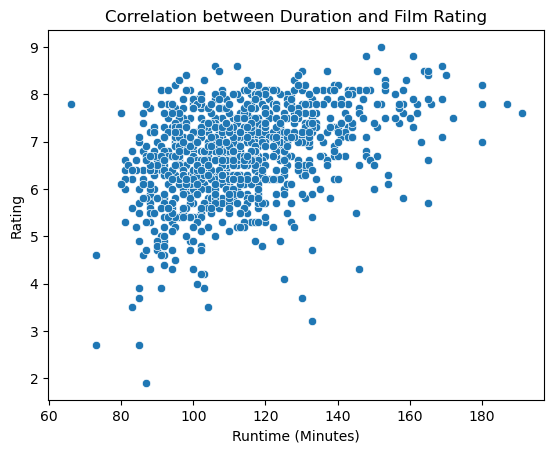

In [25]:
sns.scatterplot(x='Runtime (Minutes)', y='Rating', data=df)
plt.title("Correlation between Duration and Film Rating")


* Correlation between Metascore and Rating

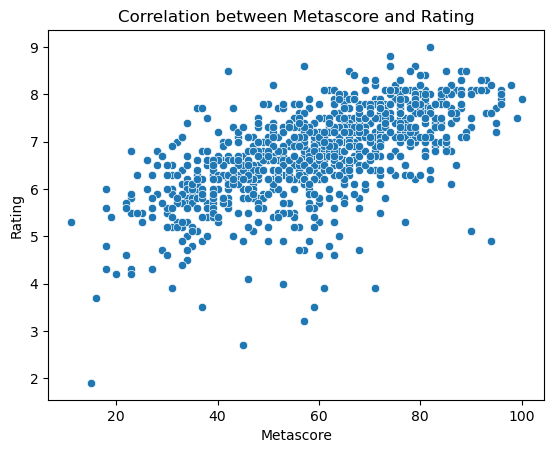

In [12]:
sns.scatterplot(data=df, x='Metascore', y='Rating')
plt.title("Correlation between Metascore and Rating")
plt.show()


* Correlation between Votes and Rating

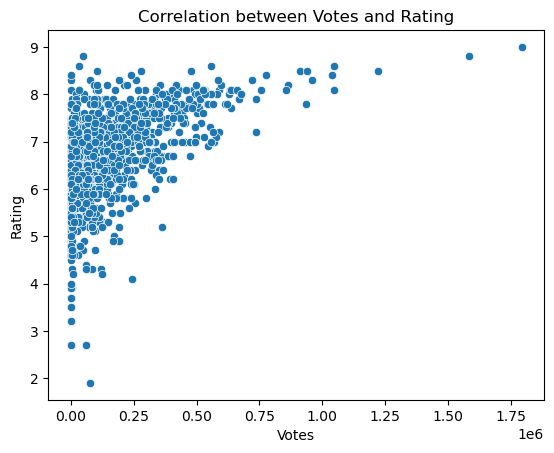

In [11]:
sns.scatterplot(data=df, x='Votes', y='Rating')
plt.title("Correlation between Votes and Rating")
plt.show()

* Correlation between Revenue and Rating

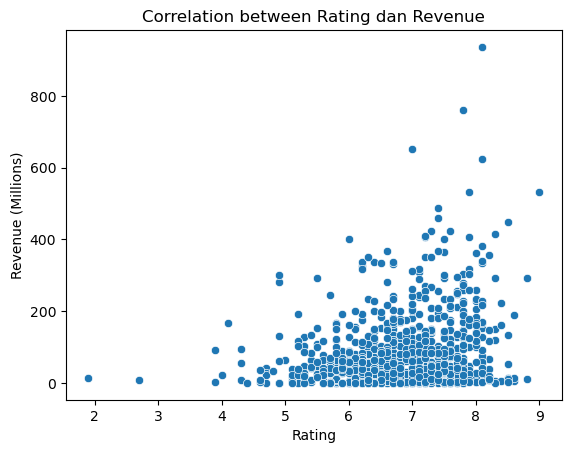

In [17]:
sns.scatterplot(data=df, x='Rating', y='Revenue (Millions)')
plt.title("Correlation between Rating dan Revenue")
plt.show()

* Correlation between Metascore, Votes, and Revenue

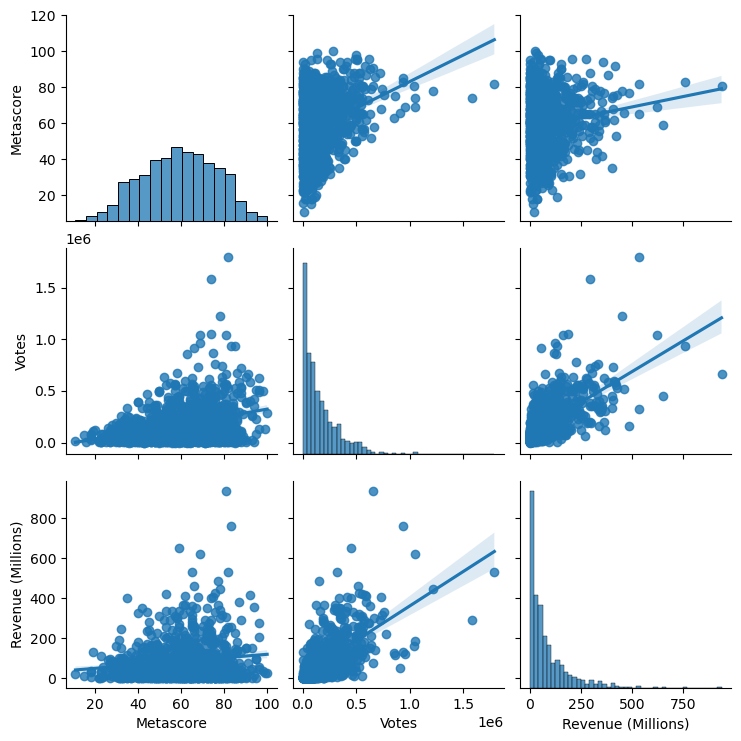

In [19]:
sns.pairplot(df, vars=['Metascore', 'Votes', 'Revenue (Millions)'], kind='reg')
plt.show()

# Best Movie Analysis

In [32]:
top_10_movies = df.sort_values(by='Rating', ascending=False).head(10)
print(top_10_movies[['Title', 'Rating', 'Year']])

                Title  Rating  Year
54    The Dark Knight     9.0  2008
80          Inception     8.8  2010
117            Dangal     8.8  2016
36       Interstellar     8.6  2014
96      Kimi no na wa     8.6  2016
249  The Intouchables     8.6  2011
133          Whiplash     8.5  2014
64       The Prestige     8.5  2006
99       The Departed     8.5  2006
991  Taare Zameen Par     8.5  2007
